Hello hello hello hello!

Resampling with nearest neighbor interpolation: https://scikit-image.org/docs/stable/api/skimage.transform.html#skimage.transform.resize

Tree delineation code: https://github.com/sizhuoli/TreeCountSegHeight?tab=readme-ov-file

YOLOv11 Validation: https://docs.ultralytics.com/modes/val/#usage-examples

Yolov11 Prediction: https://docs.ultralytics.com/modes/predict/#key-features-of-predict-mode


In [ ]:

import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.4/887.4 kB 50.0 MB/s eta 0:00:00


Unmount Drive

In [ ]:
!fusermount -u /content/drive
!rm -rf /content/drive

fusermount: failed to unmount /content/drive: Invalid argument


Start code

In [ ]:
from google.colab import drive
import os
from PIL import Image
from sklearn.model_selection import train_test_split
import torch
import shutil
import random
from IPython.display import Image, clear_output
import yaml
from ultralytics import YOLO
from osgeo import gdal
from pathlib import Path


drive.mount('/content/drive')

%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Setup complete ✅ (12 CPUs, 83.5 GB RAM, 32.5/235.7 GB disk)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Mount data from roboflow

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="1VyD4AtG1WSeLxjlhqGW")
project = rf.workspace("fullneontreeunderlabeled").project("neontree-still-labeling")
version = project.version(3)
dataset = version.download("yolov11")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to NeonTree-(still-labeling)-3 in yolov11:: 100%|██████████| 1184/1184 [00:00<00:00, 5380.13it/s]


Resampling from the new dataset

In [ ]:
def downsample_raster(src_file, dst_file, pixel_size, resampling_technique):
    gdal.UseExceptions()
    resampling_algo = gdal.GRA_Average if resampling_technique == "average" else gdal.GRA_NearestNeighbour
    success = gdal.Warp(str(dst_file),
                        str(src_file),
                        xRes=pixel_size,
                        yRes=pixel_size,
                        resampleAlg=resampling_algo,
                        options=['-to', 'SRC_METHOD=NO_GEOTRANSFORM',
                                 '-to', 'DST_METHOD=NO_GEOTRANSFORM'])
    return success is not None

def handle_dataset_split(input_folder, output_folder, split_type, pixel_size, resampling_technique):
    src_images = Path(input_folder) / split_type / 'images'
    dst_images = Path(output_folder) / split_type / 'images'
    src_annotations = Path(input_folder) / split_type / 'labels'
    dst_annotations = Path(output_folder) / split_type / 'labels'

    os.system(f'cp -n "{src_annotations}"/* "{dst_annotations}"')

    image_count = len(list(src_images.glob('*')))
    processed_count = 0

    for img in src_images.glob('*'):
        if img.suffix.lower() in ['.tif', '.png', '.jpg']:
            out_img = dst_images / img.name
            if not out_img.exists():
                result = downsample_raster(img, out_img, pixel_size, resampling_technique)
                processed_count += 1
                print(f"{'Success' if result else 'Failed'} {split_type} ({processed_count}/{image_count}): {img.name}")

def run_processing():
    raw_data_dir = '/content/NeonTree-Dataset-Raw'
    processed_data_dir = '/content/drive/MyDrive/ProjectData/ProcessedNeonTreeSplits'

    processing_configs = [
        ("avg_0.4m", 0.4, "average"),
        ("avg_0.8m", 0.8, "average"),
        ("nearest_0.4m", 0.4, "nearest"),
        ("nearest_0.8m", 0.8, "nearest")
    ]

    for config_name, pixel_size, resampling_technique in processing_configs:
        print(f"\nProcessing configuration: {config_name}")
        output_dir = os.path.join(processed_data_dir, config_name)
        for dataset_split in ['train', 'valid', 'test']:
            handle_dataset_split(raw_data_dir, output_dir, dataset_split, pixel_size, resampling_technique)

if __name__ == "__main__":
    run_processing()


Processing batch: mean_filter_0.4
Processed train (1/408): TEAK_020_jpg.rf.6fdfd47f18188420b440a8a086715982.jpg
Processed train (2/408): SOAP_031_jpg.rf.819ceb1d9c075459c42e8a7dd6e0a82d.jpg
Processed train (3/408): 2018_SJER_3_255000_4108000_image_267_jpg.rf.42ccf9e9629856da459706dbc793a89c.jpg
Processed train (4/408): 2018_TEAK_3_318000_4106000_image_165_jpg.rf.29c8854e2c9251f10bf203e1223c1107.jpg
Processed train (5/408): YELL_043_jpg.rf.d04c9aa31ff7f25cb34d080e163a3636.jpg
Processed train (6/408): 2018_TEAK_3_317000_4105000_image_542_jpg.rf.b55f1de4d8746e117e87057ffc9c9bdd.jpg
Processed train (7/408): DSNY_009_jpg.rf.af07682ad8a5577a554873ba6f5dbd83.jpg
Processed train (8/408): OSBS_039_jpg.rf.818e86931195877c9b619cf91eecb16c.jpg
Processed train (9/408): YELL_027_jpg.rf.302168b1d7882abed7b7795fc6740ed9.jpg
Processed train (10/408): TEAK_005_jpg.rf.141251b0b65a27bbc9ea918b66873729.jpg
Processed train (11/408): YELL_024_jpg.rf.ef1cb1229504f7ad3f2485b84e3e2648.jpg
Processed train (12/4

Creating YAML files

In [ ]:
def create_yaml_files(base_dir, batch_names):
    for batch_name in batch_names:
        yaml_content = {
            'train': f'{base_dir}/{batch_name}/train/images',
            'val': f'{base_dir}/{batch_name}/valid/images',
            'test': f'{base_dir}/{batch_name}/test/images',
            'nc': 1,
            'names': ['Tree']
        }

        yaml_path = os.path.join(base_dir, batch_name, 'data.yaml')

        with open(yaml_path, 'w') as f:
            yaml.safe_dump(yaml_content, f, sort_keys=False)

base_dir = '/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits'
batch_names = [
    "mean_filter_0.4",
    "mean_filter_0.8",
    "nearest_neighbor_0.4",
    "nearest_neighbor_0.8"
]

create_yaml_files(base_dir, batch_names)

Setting up YOLO11

In [ ]:
logger = 'Comet' #@param ['Comet', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 kB 4.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.7/709.7 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.8/981.8 kB 47.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 92.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 13.6 MB/s eta 0:00:00


COMET WARNING: comet_ml.init() is deprecated and will be removed soon. Please use comet_ml.login()


Please paste your Comet API key from https://www.comet.com/api/my/settings/
(api key may not show as you type)


In [ ]:
save_dir = '/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs'
os.makedirs(save_dir, exist_ok=True)

The images are of varying size, but we set it to size 416 for efficiency

Batch 1: Unprocessed

In [ ]:
model = YOLO("yolo11x.pt")

results = model.train(data="/content/NeonTree-(still-labeling)-3/data.yaml",
                      epochs=50, imgsz=416, project=save_dir, name='batch1')

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/NeonTree-(still-labeling)-3/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs, name=batch15, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_

100%|██████████| 755k/755k [00:00<00:00, 140MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      2784  ultralytics.nn.modules.conv.Conv             [3, 96, 3, 2]                 
  1                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  2                  -1  2    389760  ultralytics.nn.modules.block.C3k2            [192, 384, 2, True, 0.25]     
  3                  -1  1   1327872  ultralytics.nn.modules.conv.Conv             [384, 384, 3, 2]              
  4                  -1  2   1553664  ultralytics.nn.modules.block.C3k2            [384, 768, 2, True, 0.25]     
  5                  -1  1   5309952  ultralytics.nn.modules.conv.Conv             [768, 768, 3, 2]              
  6                  -1  2   5022720  ultralytics.nn.modules.block.C3k2            [768, 768, 2, True]           
  7                  -1  1   5309952  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 321MB/s]


AMP: checks passed ✅


train: Scanning /content/NeonTree-(still-labeling)-3/train/labels... 408 images, 78 backgrounds, 0 corrupt: 100%|██████████| 408/408 [00:00<00:00, 1216.26it/s]

train: New cache created: /content/NeonTree-(still-labeling)-3/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 3, len(boxes) = 6686. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/NeonTree-(still-labeling)-3/valid/labels... 120 images, 16 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<00:00, 947.04it/s]

val: WARNING ⚠️ /content/NeonTree-(still-labeling)-3/valid/images/BLAN_005_jpg.rf.df5ceb2214dea25e2a532499cf905175.jpg: 1 duplicate labels removed
val: New cache created: /content/NeonTree-(still-labeling)-3/valid/labels.cache


Plotting labels to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch15/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch15
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      8.55G      2.527       2.39      2.089        184        416: 100%|██████████| 26/26 [00:07<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        120       2208     0.0016     0.0177   0.000815   0.000156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.82G      2.405      1.949      1.854        107        416: 100%|██████████| 26/26 [00:05<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.77it/s]

                   all        120       2208     0.0016     0.0177   0.000815   0.000156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.82G       2.42      1.978      1.843        151        416: 100%|██████████| 26/26 [00:05<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.27it/s]

                   all        120       2208     0.0016     0.0177   0.000815   0.000156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      8.12G      2.366      1.997       1.77        143        416: 100%|██████████| 26/26 [00:04<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.52it/s]

                   all        120       2208    0.00339    0.00226    0.00668    0.00231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.96G      2.314      1.876      1.758        182        416: 100%|██████████| 26/26 [00:04<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.13it/s]

                   all        120       2208      0.137     0.0312     0.0187    0.00747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.89G       2.32      1.883       1.74        218        416: 100%|██████████| 26/26 [00:04<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.71it/s]


                   all        120       2208     0.0547    0.00815     0.0323     0.0133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.89G      2.321      1.845      1.697        176        416: 100%|██████████| 26/26 [00:04<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.54it/s]

                   all        120       2208     0.0683       0.27     0.0416     0.0136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      8.11G      2.312      1.913      1.712        164        416: 100%|██████████| 26/26 [00:04<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.44it/s]

                   all        120       2208       0.13      0.114     0.0507     0.0158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      8.11G      2.237      1.842      1.694        279        416: 100%|██████████| 26/26 [00:04<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]

                   all        120       2208      0.202      0.281      0.147     0.0518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.82G      2.225      1.811      1.656         71        416: 100%|██████████| 26/26 [00:04<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.82it/s]

                   all        120       2208      0.325      0.338      0.247     0.0874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.68G      2.177      1.726      1.656        102        416: 100%|██████████| 26/26 [00:04<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.69it/s]

                   all        120       2208      0.409      0.388      0.319      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      8.01G      2.196      1.717      1.636        243        416: 100%|██████████| 26/26 [00:04<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.33it/s]

                   all        120       2208      0.325      0.329      0.237     0.0809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.76G      2.183       1.72      1.649        288        416: 100%|██████████| 26/26 [00:04<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.47it/s]

                   all        120       2208       0.38      0.365       0.29      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.83G      2.161      1.709      1.621        153        416: 100%|██████████| 26/26 [00:04<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.47it/s]

                   all        120       2208      0.286      0.307      0.221     0.0757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       7.8G      2.166      1.739      1.627         64        416: 100%|██████████| 26/26 [00:04<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.43it/s]

                   all        120       2208      0.324      0.333      0.237     0.0829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.84G       2.13      1.719       1.63         88        416: 100%|██████████| 26/26 [00:04<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.34it/s]

                   all        120       2208      0.363      0.351      0.259     0.0928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.77G      2.108      1.681      1.614        129        416: 100%|██████████| 26/26 [00:04<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.31it/s]

                   all        120       2208      0.301      0.284      0.198     0.0667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       7.9G      2.108      1.679      1.618        135        416: 100%|██████████| 26/26 [00:04<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.71it/s]

                   all        120       2208      0.371      0.383      0.292      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      8.03G      2.132      1.652      1.597        127        416: 100%|██████████| 26/26 [00:04<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.88it/s]

                   all        120       2208      0.424      0.414      0.353      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      8.03G      2.122      1.678      1.597         66        416: 100%|██████████| 26/26 [00:04<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.52it/s]

                   all        120       2208      0.455      0.395      0.363      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      8.46G      2.094      1.608       1.58        123        416: 100%|██████████| 26/26 [00:04<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.61it/s]

                   all        120       2208      0.308      0.381      0.261     0.0979



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      8.06G      2.132      1.634      1.593        311        416: 100%|██████████| 26/26 [00:04<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.33it/s]

                   all        120       2208      0.424      0.354      0.322      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.88G      2.099      1.618      1.577        101        416: 100%|██████████| 26/26 [00:04<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.82it/s]

                   all        120       2208      0.369      0.371      0.293      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      8.07G      2.083      1.613      1.573         96        416: 100%|██████████| 26/26 [00:04<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.90it/s]

                   all        120       2208      0.424      0.432       0.36      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.63G      2.084      1.602      1.575        170        416: 100%|██████████| 26/26 [00:04<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.90it/s]

                   all        120       2208      0.428      0.424      0.377      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.87G      2.087        1.6      1.571        105        416: 100%|██████████| 26/26 [00:04<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.65it/s]

                   all        120       2208      0.427      0.434      0.384       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      8.04G      2.053      1.602      1.581        147        416: 100%|██████████| 26/26 [00:04<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.75it/s]

                   all        120       2208      0.486      0.444      0.407      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      8.08G      2.096      1.574      1.545        125        416: 100%|██████████| 26/26 [00:04<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.55it/s]

                   all        120       2208      0.308      0.406      0.278     0.0995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.85G      2.044       1.61      1.573        101        416: 100%|██████████| 26/26 [00:04<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.59it/s]

                   all        120       2208      0.444      0.407      0.361      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       7.8G      2.053      1.556      1.549        484        416: 100%|██████████| 26/26 [00:04<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.60it/s]

                   all        120       2208      0.414      0.423      0.356      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.94G      1.991      1.528      1.533        171        416: 100%|██████████| 26/26 [00:04<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.72it/s]

                   all        120       2208      0.483      0.421      0.404       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.84G      2.033      1.556      1.558         74        416: 100%|██████████| 26/26 [00:04<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.80it/s]

                   all        120       2208      0.486      0.448      0.401      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.75G          2      1.564      1.557        104        416: 100%|██████████| 26/26 [00:04<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.46it/s]

                   all        120       2208      0.442      0.436      0.387      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      8.11G      1.993      1.495      1.523        100        416: 100%|██████████| 26/26 [00:04<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.86it/s]

                   all        120       2208      0.454      0.448      0.394       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.84G          2       1.51      1.549        116        416: 100%|██████████| 26/26 [00:04<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.67it/s]

                   all        120       2208      0.473      0.454      0.418      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       7.8G      2.009      1.503      1.544         94        416: 100%|██████████| 26/26 [00:04<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.69it/s]

                   all        120       2208      0.462      0.442      0.399      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.91G      1.988      1.449      1.512        162        416: 100%|██████████| 26/26 [00:04<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.91it/s]

                   all        120       2208      0.458       0.45      0.404      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      8.16G       1.97        1.5      1.537        176        416: 100%|██████████| 26/26 [00:04<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.67it/s]

                   all        120       2208      0.496      0.446      0.423      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      8.15G      2.002      1.455      1.499        505        416: 100%|██████████| 26/26 [00:04<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.76it/s]

                   all        120       2208      0.479      0.441      0.417      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.87G      1.968      1.412      1.498        204        416: 100%|██████████| 26/26 [00:04<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.74it/s]

                   all        120       2208      0.494      0.496      0.459      0.186


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.96G      1.969      1.568      1.559         92        416: 100%|██████████| 26/26 [00:05<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.17it/s]

                   all        120       2208      0.476       0.42      0.415      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.82G      1.967      1.552      1.582         41        416: 100%|██████████| 26/26 [00:04<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.35it/s]

                   all        120       2208      0.492      0.458      0.405      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.88G      1.979      1.518      1.572        187        416: 100%|██████████| 26/26 [00:04<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.57it/s]

                   all        120       2208      0.495      0.478      0.439      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         8G      1.942      1.491      1.556         92        416: 100%|██████████| 26/26 [00:04<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.65it/s]

                   all        120       2208      0.499      0.479      0.447       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.98G      1.935      1.435      1.544         89        416: 100%|██████████| 26/26 [00:04<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.82it/s]

                   all        120       2208      0.493      0.473      0.442      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.86G      1.941      1.441      1.569         47        416: 100%|██████████| 26/26 [00:04<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.59it/s]

                   all        120       2208      0.486      0.491      0.445      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      8.01G      1.946      1.461      1.579         78        416: 100%|██████████| 26/26 [00:04<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.82it/s]

                   all        120       2208       0.51      0.476       0.46      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.79G      1.919      1.421      1.568         84        416: 100%|██████████| 26/26 [00:04<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.75it/s]

                   all        120       2208      0.508      0.487      0.461      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.89G      1.899       1.44       1.54         88        416: 100%|██████████| 26/26 [00:04<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.79it/s]

                   all        120       2208      0.496       0.48       0.45       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.85G      1.925       1.41       1.57        182        416: 100%|██████████| 26/26 [00:04<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.72it/s]

                   all        120       2208      0.517      0.477      0.462      0.186



50 epochs completed in 0.112 hours.
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch15/weights/last.pt, 114.4MB
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch15/weights/best.pt, 114.4MB

Validating /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch15/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]


                   all        120       2208      0.518      0.479      0.463      0.187
Speed: 0.1ms preprocess, 2.1ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch15


In [ ]:
model = YOLO("/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch15/weights/best.pt")  # load your trained model

metrics = model.val(data="/content/NeonTree-(still-labeling)-3/data.yaml", split="test")

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


val: Scanning /content/NeonTree-(still-labeling)-3/test/labels.cache... 58 images, 6 backgrounds, 0 corrupt: 100%|██████████| 58/58 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]


                   all         58       1271      0.545      0.516       0.51      0.216
Speed: 0.1ms preprocess, 4.4ms inference, 0.0ms loss, 4.8ms postprocess per image
Results saved to runs/detect/val3
0.21613619012455873
0.5103592260908775
0.1322093093120636
[    0.21614]


Mean filter 0.4 batch

In [ ]:
model = YOLO("yolo11x.pt")

results = model.train(data="/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/mean_filter_0.4/data.yaml",
                      epochs=50, imgsz=416, project=save_dir, name='batch2')

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/mean_filter_0.4/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs, name=batch22, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None,

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: sklearn, torch.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet.com https://www.comet.com/coatow/content-drive-mydrive-565project-yolov11-training-outputs/28441a7fb0344466a5a665a481110ef3

COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.


TensorBoard: Start with 'tensorboard --logdir /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch22', view at http://localhost:6006/
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅


train: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.4/train/labels.cache... 408 images, 78 backgrounds, 0 corrupt: 100%|██████████| 408/408 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 3, len(boxes) = 6686. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.4/valid/labels.cache... 120 images, 16 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.4/valid/images/BLAN_005_jpg.rf.df5ceb2214dea25e2a532499cf905175.jpg: 1 duplicate labels removed


Plotting labels to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch22/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch22
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      8.56G      2.543      2.381      2.091        184        416: 100%|██████████| 26/26 [00:06<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.51it/s]

                   all        120       2208          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      8.02G      2.392      1.983      1.837        107        416: 100%|██████████| 26/26 [00:05<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.97it/s]

                   all        120       2208          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.83G      2.428      1.936      1.821        151        416: 100%|██████████| 26/26 [00:05<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.40it/s]

                   all        120       2208          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      8.11G      2.376      1.996       1.79        143        416: 100%|██████████| 26/26 [00:05<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.08it/s]

                   all        120       2208     0.0763     0.0684     0.0311     0.0108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.97G      2.379      1.904      1.806        182        416: 100%|██████████| 26/26 [00:05<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.27it/s]

                   all        120       2208     0.0763     0.0684     0.0311     0.0108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.87G      2.366      1.911      1.741        218        416: 100%|██████████| 26/26 [00:04<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.47it/s]

                   all        120       2208     0.0111   0.000453   0.000375   0.000113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.88G      2.317      1.905      1.696        176        416: 100%|██████████| 26/26 [00:05<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.19it/s]

                   all        120       2208      0.097      0.269     0.0706     0.0233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      8.11G      2.282      1.873      1.694        164        416: 100%|██████████| 26/26 [00:05<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.23it/s]


                   all        120       2208      0.322      0.288      0.213     0.0697

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      8.11G      2.251       1.84       1.71        279        416: 100%|██████████| 26/26 [00:04<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.97it/s]


                   all        120       2208      0.307      0.293      0.214     0.0741

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.82G      2.208       1.79      1.662         71        416: 100%|██████████| 26/26 [00:05<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.43it/s]

                   all        120       2208      0.104     0.0584     0.0299    0.00923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.68G      2.169      1.722      1.661        102        416: 100%|██████████| 26/26 [00:05<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.63it/s]

                   all        120       2208      0.381      0.298      0.231     0.0832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         8G       2.17      1.699      1.619        243        416: 100%|██████████| 26/26 [00:05<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.72it/s]

                   all        120       2208      0.369      0.357      0.279      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.76G      2.188      1.708      1.647        288        416: 100%|██████████| 26/26 [00:04<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]


                   all        120       2208      0.369      0.356      0.276      0.102

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.82G       2.17      1.724      1.621        153        416: 100%|██████████| 26/26 [00:05<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.01it/s]


                   all        120       2208       0.37      0.395      0.291      0.105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       7.8G      2.151      1.735      1.611         64        416: 100%|██████████| 26/26 [00:05<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.13it/s]


                   all        120       2208      0.351      0.327      0.278        0.1

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.83G      2.128      1.715      1.624         88        416: 100%|██████████| 26/26 [00:05<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.75it/s]


                   all        120       2208      0.392      0.357      0.286      0.102

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.77G      2.116       1.68      1.615        129        416: 100%|██████████| 26/26 [00:05<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.78it/s]

                   all        120       2208      0.288      0.262      0.169      0.056



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.89G      2.118      1.663      1.622        135        416: 100%|██████████| 26/26 [00:05<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.82it/s]


                   all        120       2208      0.391       0.38      0.314      0.117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      8.04G       2.12      1.648      1.584        127        416: 100%|██████████| 26/26 [00:05<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.18it/s]


                   all        120       2208      0.413      0.384      0.333      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      8.03G      2.121      1.672      1.595         66        416: 100%|██████████| 26/26 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.92it/s]

                   all        120       2208      0.424      0.394      0.345      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      8.46G      2.113      1.598      1.586        123        416: 100%|██████████| 26/26 [00:05<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.83it/s]


                   all        120       2208      0.294      0.365      0.252      0.089

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      8.06G      2.139      1.634      1.585        311        416: 100%|██████████| 26/26 [00:05<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.04it/s]


                   all        120       2208      0.432      0.423      0.361      0.137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.89G        2.1      1.622      1.575        101        416: 100%|██████████| 26/26 [00:04<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.45it/s]

                   all        120       2208      0.407      0.423      0.347      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      8.07G      2.097      1.631      1.576         96        416: 100%|██████████| 26/26 [00:05<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.47it/s]

                   all        120       2208      0.446      0.419       0.37      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.63G      2.083       1.58      1.581        170        416: 100%|██████████| 26/26 [00:05<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.37it/s]


                   all        120       2208      0.398      0.412      0.338      0.126

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.87G      2.075      1.595      1.559        105        416: 100%|██████████| 26/26 [00:05<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]

                   all        120       2208      0.431      0.426      0.373      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      8.04G      2.053      1.588      1.574        147        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.16it/s]


                   all        120       2208      0.428      0.443      0.373       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      8.08G      2.075      1.566      1.539        125        416: 100%|██████████| 26/26 [00:05<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.16it/s]

                   all        120       2208      0.403      0.407      0.334      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.84G       2.05      1.597      1.577        101        416: 100%|██████████| 26/26 [00:05<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.16it/s]

                   all        120       2208      0.446       0.43      0.391       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.79G      2.056      1.566      1.545        484        416: 100%|██████████| 26/26 [00:05<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]

                   all        120       2208      0.394      0.442      0.358       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.93G      2.003      1.541      1.534        171        416: 100%|██████████| 26/26 [00:05<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.86it/s]

                   all        120       2208      0.445      0.442      0.398      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.84G      2.034      1.571       1.56         74        416: 100%|██████████| 26/26 [00:05<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.45it/s]

                   all        120       2208      0.461      0.372      0.361      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.75G       1.99      1.563      1.565        104        416: 100%|██████████| 26/26 [00:05<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.97it/s]

                   all        120       2208       0.46      0.442       0.41      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      8.11G      1.971      1.499      1.523        100        416: 100%|██████████| 26/26 [00:05<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.09it/s]

                   all        120       2208      0.462      0.451      0.393      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.84G      1.993      1.494      1.544        116        416: 100%|██████████| 26/26 [00:05<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.44it/s]

                   all        120       2208      0.476      0.445      0.406      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       7.8G      1.998      1.496      1.537         94        416: 100%|██████████| 26/26 [00:05<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.08it/s]


                   all        120       2208      0.459      0.461      0.398       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.91G      1.992      1.451      1.512        162        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.29it/s]


                   all        120       2208       0.47      0.475      0.415      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      8.15G      1.965      1.504      1.534        176        416: 100%|██████████| 26/26 [00:05<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.22it/s]


                   all        120       2208       0.47       0.43      0.417      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      8.15G      1.996      1.452      1.506        505        416: 100%|██████████| 26/26 [00:05<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.95it/s]


                   all        120       2208       0.45      0.439      0.395      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.86G      1.961      1.409      1.496        204        416: 100%|██████████| 26/26 [00:05<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.33it/s]


                   all        120       2208      0.502      0.497      0.467      0.188
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.97G      1.986       1.53      1.557         92        416: 100%|██████████| 26/26 [00:08<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.45it/s]

                   all        120       2208      0.493      0.452      0.443      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.82G      1.965      1.509      1.578         41        416: 100%|██████████| 26/26 [00:05<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.97it/s]


                   all        120       2208      0.478       0.47      0.424      0.166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.87G      1.981      1.509      1.569        187        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.83it/s]


                   all        120       2208      0.481      0.449        0.4      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      7.99G      1.941      1.479      1.553         92        416: 100%|██████████| 26/26 [00:05<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.52it/s]

                   all        120       2208       0.47      0.473      0.439      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.97G      1.957       1.43       1.55         89        416: 100%|██████████| 26/26 [00:04<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.18it/s]

                   all        120       2208      0.502      0.481      0.458      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.85G      1.944       1.41       1.56         47        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]

                   all        120       2208      0.505      0.476      0.451      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      8.01G       1.94      1.439      1.563         78        416: 100%|██████████| 26/26 [00:05<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.09it/s]

                   all        120       2208      0.506      0.482      0.458      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.78G       1.92       1.41      1.558         84        416: 100%|██████████| 26/26 [00:05<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.86it/s]


                   all        120       2208      0.524      0.479      0.472      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.88G       1.91      1.426      1.538         88        416: 100%|██████████| 26/26 [00:05<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.35it/s]


                   all        120       2208      0.525      0.478       0.47      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.85G      1.916      1.392      1.559        182        416: 100%|██████████| 26/26 [00:05<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.07it/s]


                   all        120       2208      0.533      0.481      0.475      0.187

50 epochs completed in 0.152 hours.
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch22/weights/last.pt, 114.4MB
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch22/weights/best.pt, 114.4MB

Validating /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch22/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]


                   all        120       2208      0.531      0.482      0.475      0.187
Speed: 0.1ms preprocess, 2.2ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch22


COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : various_slab_2782
COMET INFO:     url                   : https://www.comet.com/coatow/content-drive-mydrive-565project-yolov11-training-outputs/28441a7fb0344466a5a665a481110ef3
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     lr/pg0 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     lr/pg1 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     lr/pg2 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     metrics/mAP50(B) [102]     : (0.0, 0.4747513158248211)
COMET INFO:     metrics/mAP50-95(B) [102]  : (0.0, 0.18808)
COMET INFO:     metrics/precision(B) [102] : (0.0, 0.53316)
COME

In [ ]:
model = YOLO("/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/mean04/weights/best.pt")

metrics = model.val(data="/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/mean_filter_0.4/data.yaml", split="test")

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


val: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.4/test/labels... 58 images, 6 backgrounds, 0 corrupt: 100%|██████████| 58/58 [00:20<00:00,  2.88it/s]

val: New cache created: /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.4/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:10<00:00,  2.71s/it]


                   all         58       1271      0.566      0.507      0.513      0.219
Speed: 2.0ms preprocess, 17.5ms inference, 0.0ms loss, 9.1ms postprocess per image
Results saved to runs/detect/val4
0.21935933318381381
0.5126655202891355
0.14700954121805698
[    0.21936]


Mean filter 0.8

In [ ]:
model = YOLO("yolo11x.pt")

results = model.train(data="/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/mean_filter_0.8/data.yaml",
                      epochs=50, imgsz=416, project=save_dir, name='batch3')

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/mean_filter_0.8/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs, name=batch3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, 

train: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.8/train/labels.cache... 408 images, 78 backgrounds, 0 corrupt: 100%|██████████| 408/408 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 3, len(boxes) = 6686. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.8/valid/labels.cache... 120 images, 16 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.8/valid/images/BLAN_005_jpg.rf.df5ceb2214dea25e2a532499cf905175.jpg: 1 duplicate labels removed


Plotting labels to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      9.56G      2.579      2.469      2.149        184        416: 100%|██████████| 26/26 [00:06<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.17it/s]

                   all        120       2208    0.00469     0.0272     0.0019   0.000662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      9.05G      2.435      2.001      1.869        107        416: 100%|██████████| 26/26 [00:05<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.46it/s]

                   all        120       2208    0.00469     0.0272     0.0019   0.000662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      8.85G      2.418      1.998      1.818        151        416: 100%|██████████| 26/26 [00:05<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.21it/s]

                   all        120       2208    0.00469     0.0272     0.0019   0.000662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      9.14G      2.353      1.993       1.78        143        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.63it/s]

                   all        120       2208    0.00157   0.000453   0.000634   0.000254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      8.99G      2.311      1.876      1.743        182        416: 100%|██████████| 26/26 [00:05<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.95it/s]

                   all        120       2208    0.00908     0.0426    0.00473    0.00133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      8.91G       2.37       1.93      1.734        218        416: 100%|██████████| 26/26 [00:05<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.43it/s]

                   all        120       2208      0.184      0.169        0.1     0.0324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      8.91G      2.351      1.919      1.726        176        416: 100%|██████████| 26/26 [00:05<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.61it/s]

                   all        120       2208     0.0316   0.000453   0.000619   0.000247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      9.14G      2.343      1.973      1.732        164        416: 100%|██████████| 26/26 [00:05<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.31it/s]

                   all        120       2208     0.0668     0.0774      0.031     0.0105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      9.13G      2.263      1.884      1.715        279        416: 100%|██████████| 26/26 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.19it/s]

                   all        120       2208     0.0946     0.0598     0.0352     0.0138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      8.84G      2.233      1.837      1.661         71        416: 100%|██████████| 26/26 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.98it/s]

                   all        120       2208      0.225      0.274      0.143     0.0506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      8.71G       2.19      1.751      1.657        102        416: 100%|██████████| 26/26 [00:05<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.81it/s]

                   all        120       2208      0.342      0.344      0.247     0.0868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      9.04G      2.199       1.75      1.632        243        416: 100%|██████████| 26/26 [00:05<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.85it/s]


                   all        120       2208      0.363      0.355      0.294      0.105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      8.79G        2.2      1.747      1.655        288        416: 100%|██████████| 26/26 [00:04<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.84it/s]

                   all        120       2208      0.338      0.306      0.221     0.0803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      8.85G      2.166      1.708      1.632        153        416: 100%|██████████| 26/26 [00:06<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.74it/s]

                   all        120       2208      0.384      0.396      0.303      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      8.83G      2.148      1.735      1.619         64        416: 100%|██████████| 26/26 [00:04<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.23it/s]

                   all        120       2208      0.307      0.322      0.242     0.0881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      8.87G      2.128      1.744      1.625         88        416: 100%|██████████| 26/26 [00:05<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.00it/s]

                   all        120       2208      0.351      0.346      0.271     0.0989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       8.8G      2.115      1.706       1.61        129        416: 100%|██████████| 26/26 [00:04<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.86it/s]


                   all        120       2208      0.348      0.351      0.278        0.1

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      8.92G      2.135      1.696      1.618        135        416: 100%|██████████| 26/26 [00:05<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.42it/s]

                   all        120       2208      0.371      0.371      0.303       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      9.07G      2.164      1.687      1.611        127        416: 100%|██████████| 26/26 [00:04<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]

                   all        120       2208      0.381      0.337      0.285     0.0956



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      9.06G      2.137      1.687      1.596         66        416: 100%|██████████| 26/26 [00:05<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.29it/s]

                   all        120       2208      0.369      0.385      0.313      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      9.49G      2.104      1.609      1.581        123        416: 100%|██████████| 26/26 [00:05<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.23it/s]


                   all        120       2208      0.423      0.391      0.335      0.127

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      9.08G      2.125      1.651      1.587        311        416: 100%|██████████| 26/26 [00:05<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.78it/s]

                   all        120       2208      0.414      0.383      0.327      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      8.91G      2.111      1.662      1.576        101        416: 100%|██████████| 26/26 [00:05<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.48it/s]

                   all        120       2208      0.416      0.381      0.336      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       9.1G      2.087      1.646      1.578         96        416: 100%|██████████| 26/26 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.99it/s]


                   all        120       2208      0.416      0.404       0.34      0.126

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      8.66G       2.08      1.597       1.58        170        416: 100%|██████████| 26/26 [00:05<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.56it/s]

                   all        120       2208      0.437      0.421      0.372      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       8.9G      2.074       1.62      1.546        105        416: 100%|██████████| 26/26 [00:05<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.33it/s]

                   all        120       2208      0.445      0.415       0.38      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      9.08G      2.067      1.624      1.572        147        416: 100%|██████████| 26/26 [00:05<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.69it/s]


                   all        120       2208      0.454      0.414      0.374       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      9.11G      2.089      1.586      1.542        125        416: 100%|██████████| 26/26 [00:05<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.60it/s]

                   all        120       2208      0.422      0.398      0.339      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      8.88G      2.048      1.611      1.566        101        416: 100%|██████████| 26/26 [00:05<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.13it/s]

                   all        120       2208      0.482      0.423       0.39      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      8.82G      2.072      1.563      1.543        484        416: 100%|██████████| 26/26 [00:05<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.25it/s]


                   all        120       2208      0.437      0.432      0.367      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      8.97G      2.022      1.561      1.528        171        416: 100%|██████████| 26/26 [00:05<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.99it/s]


                   all        120       2208      0.473      0.428      0.399      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.86G       2.05      1.593      1.547         74        416: 100%|██████████| 26/26 [00:05<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.47it/s]

                   all        120       2208      0.436      0.422      0.373      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      8.78G      2.002      1.582      1.553        104        416: 100%|██████████| 26/26 [00:05<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.93it/s]


                   all        120       2208      0.417      0.453      0.389      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      9.13G      1.992       1.52      1.524        100        416: 100%|██████████| 26/26 [00:05<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.46it/s]

                   all        120       2208      0.437      0.464      0.375      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      8.87G      2.004      1.535       1.54        116        416: 100%|██████████| 26/26 [00:04<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]

                   all        120       2208      0.484      0.421      0.405      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      8.82G      2.009      1.513      1.541         94        416: 100%|██████████| 26/26 [00:05<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.59it/s]


                   all        120       2208      0.466      0.442      0.407       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      8.94G      2.006      1.479      1.512        162        416: 100%|██████████| 26/26 [00:04<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.29it/s]


                   all        120       2208      0.466      0.472      0.417      0.166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      9.18G       1.99      1.519      1.541        176        416: 100%|██████████| 26/26 [00:05<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.39it/s]

                   all        120       2208      0.471      0.436      0.415      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      9.18G      2.007      1.477      1.499        505        416: 100%|██████████| 26/26 [00:05<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.01it/s]

                   all        120       2208      0.473      0.446      0.415      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       8.9G       1.96      1.425      1.495        204        416: 100%|██████████| 26/26 [00:05<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.22it/s]

                   all        120       2208      0.497      0.492      0.454      0.183


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      8.99G       1.98      1.583      1.555         92        416: 100%|██████████| 26/26 [00:06<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.82it/s]


                   all        120       2208      0.491      0.446      0.421      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      8.85G      1.978      1.573      1.584         41        416: 100%|██████████| 26/26 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.48it/s]


                   all        120       2208       0.51      0.438       0.42      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      8.91G      1.998      1.569      1.574        187        416: 100%|██████████| 26/26 [00:05<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.39it/s]

                   all        120       2208      0.425      0.431      0.362      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      9.02G      1.951      1.528      1.553         92        416: 100%|██████████| 26/26 [00:05<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.96it/s]


                   all        120       2208      0.472      0.454      0.419      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         9G      1.954      1.458      1.544         89        416: 100%|██████████| 26/26 [00:04<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.69it/s]

                   all        120       2208      0.484      0.467      0.431      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      8.87G      1.956      1.461       1.56         47        416: 100%|██████████| 26/26 [00:05<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]

                   all        120       2208      0.478      0.476      0.429      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      9.04G      1.956      1.479      1.569         78        416: 100%|██████████| 26/26 [00:05<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.14it/s]

                   all        120       2208      0.502      0.482      0.447      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      8.82G      1.939      1.447      1.562         84        416: 100%|██████████| 26/26 [00:04<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.64it/s]

                   all        120       2208      0.504      0.477      0.458      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      8.92G      1.931      1.468       1.54         88        416: 100%|██████████| 26/26 [00:05<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.40it/s]

                   all        120       2208      0.521      0.461      0.451      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      8.88G      1.932      1.435      1.564        182        416: 100%|██████████| 26/26 [00:04<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.42it/s]

                   all        120       2208      0.527      0.475      0.458      0.185



50 epochs completed in 0.123 hours.
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch3/weights/last.pt, 114.4MB
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch3/weights/best.pt, 114.4MB

Validating /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch3/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]


                   all        120       2208      0.527      0.475      0.457      0.185
Speed: 0.1ms preprocess, 2.2ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch3


COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : alive_humvee_7336
COMET INFO:     url                   : https://www.comet.com/coatow/content-drive-mydrive-565project-yolov11-training-outputs/d3c3f8d8dd4343b7916fa859df69362c
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     lr/pg0 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     lr/pg1 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     lr/pg2 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     metrics/mAP50(B) [102]     : (0.00062, 0.45846)
COMET INFO:     metrics/mAP50-95(B) [102]  : (0.00025, 0.1851)
COMET INFO:     metrics/precision(B) [102] : (0.00157, 0.52739832737

In [ ]:
model = YOLO("/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/mean08/weights/best.pt")

metrics = model.val(data="/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/mean_filter_0.8/data.yaml", split="test")

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


val: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.8/test/labels... 58 images, 6 backgrounds, 0 corrupt: 100%|██████████| 58/58 [00:11<00:00,  4.90it/s]

val: New cache created: /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/mean_filter_0.8/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.58it/s]


                   all         58       1271      0.541      0.476      0.494      0.212
Speed: 1.7ms preprocess, 22.8ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to runs/detect/val5
0.21218515816858705
0.4938810859026098
0.14180899080766426
[    0.21219]


Nearest Neighbor 0.4

In [ ]:
model = YOLO("yolo11x.pt")

results = model.train(data="/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.4/data.yaml", epochs=50, imgsz=416,
                      project=save_dir, name='batch4')

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.4/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs, name=batch4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=N

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: sklearn, torch.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/coatow/content-drive-mydrive-565project-yolov11-training-outputs/6ae68b65c5a5466ab3a169a3aa209e32



TensorBoard: Start with 'tensorboard --logdir /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch4', view at http://localhost:6006/
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅


train: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.4/train/labels.cache... 408 images, 78 backgrounds, 0 corrupt: 100%|██████████| 408/408 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 3, len(boxes) = 6686. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.4/valid/labels.cache... 120 images, 16 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.4/valid/images/BLAN_005_jpg.rf.df5ceb2214dea25e2a532499cf905175.jpg: 1 duplicate labels removed


Plotting labels to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      9.56G      2.542      2.425      2.095        184        416: 100%|██████████| 26/26 [00:06<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.37it/s]

                   all        120       2208    0.00876     0.0326    0.00493    0.00161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      9.05G      2.418      2.017      1.842        107        416: 100%|██████████| 26/26 [00:05<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.14it/s]

                   all        120       2208     0.0118     0.0879    0.00663    0.00201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      8.86G      2.412      1.989       1.81        151        416: 100%|██████████| 26/26 [00:05<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.07it/s]

                   all        120       2208    0.00917    0.00996    0.00464    0.00116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      9.13G      2.385      1.981      1.776        143        416: 100%|██████████| 26/26 [00:05<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.95it/s]

                   all        120       2208     0.0378     0.0163     0.0215    0.00653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      8.98G      2.355      1.874      1.748        182        416: 100%|██████████| 26/26 [00:05<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.99it/s]


                   all        120       2208      0.101        0.2     0.0589     0.0183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      8.89G      2.339      1.896      1.716        218        416: 100%|██████████| 26/26 [00:05<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.33it/s]

                   all        120       2208      0.164      0.218     0.0999      0.029



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       8.9G      2.331      1.975      1.708        176        416: 100%|██████████| 26/26 [00:04<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.92it/s]


                   all        120       2208       0.22      0.217      0.136     0.0451

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      9.13G      2.275      1.867      1.685        164        416: 100%|██████████| 26/26 [00:05<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.29it/s]

                   all        120       2208      0.214      0.169      0.102     0.0312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      9.13G      2.254      1.882       1.69        279        416: 100%|██████████| 26/26 [00:04<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.38it/s]

                   all        120       2208      0.127      0.231      0.078      0.027



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      8.84G      2.206      1.772       1.64         71        416: 100%|██████████| 26/26 [00:05<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.03it/s]


                   all        120       2208      0.319      0.327      0.238     0.0838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       8.7G      2.198       1.74      1.654        102        416: 100%|██████████| 26/26 [00:05<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.39it/s]

                   all        120       2208      0.182      0.128     0.0722     0.0258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      9.03G      2.197      1.748      1.611        243        416: 100%|██████████| 26/26 [00:05<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.16it/s]

                   all        120       2208      0.336      0.277      0.218     0.0788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      8.78G      2.197      1.759      1.634        288        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.09it/s]


                   all        120       2208      0.314      0.283      0.209     0.0702

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      8.84G        2.2      1.766      1.632        153        416: 100%|██████████| 26/26 [00:05<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.03it/s]


                   all        120       2208      0.217      0.219      0.143     0.0502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      8.82G      2.166       1.79      1.608         64        416: 100%|██████████| 26/26 [00:05<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.04it/s]


                   all        120       2208      0.348      0.322       0.27     0.0946

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      8.86G      2.159      1.785      1.641         88        416: 100%|██████████| 26/26 [00:05<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.76it/s]


                   all        120       2208      0.418      0.383      0.328      0.119

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      8.78G      2.131      1.709      1.618        129        416: 100%|██████████| 26/26 [00:05<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.28it/s]

                   all        120       2208      0.372      0.374      0.295      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      8.92G      2.108      1.703        1.6        135        416: 100%|██████████| 26/26 [00:05<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.80it/s]

                   all        120       2208      0.367      0.342       0.28      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      9.05G       2.15      1.672      1.594        127        416: 100%|██████████| 26/26 [00:05<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]

                   all        120       2208      0.384      0.349      0.291      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      9.06G      2.151      1.688      1.601         66        416: 100%|██████████| 26/26 [00:05<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.36it/s]

                   all        120       2208      0.404      0.342      0.306      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      9.48G      2.101      1.603       1.58        123        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.03it/s]


                   all        120       2208      0.413      0.403      0.354      0.132

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      9.07G      2.155      1.646       1.59        311        416: 100%|██████████| 26/26 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.56it/s]

                   all        120       2208      0.447      0.407      0.376      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       8.9G      2.102      1.631      1.573        101        416: 100%|██████████| 26/26 [00:05<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.07it/s]


                   all        120       2208      0.405      0.353      0.309      0.117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       9.1G      2.117      1.637      1.583         96        416: 100%|██████████| 26/26 [00:05<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.40it/s]

                   all        120       2208      0.422      0.417      0.344       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      8.65G      2.103      1.606      1.579        170        416: 100%|██████████| 26/26 [00:05<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.32it/s]


                   all        120       2208      0.452      0.406      0.366      0.139

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       8.9G      2.093      1.614      1.567        105        416: 100%|██████████| 26/26 [00:05<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.19it/s]


                   all        120       2208      0.445      0.402      0.365      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      9.06G      2.059      1.613       1.57        147        416: 100%|██████████| 26/26 [00:05<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.49it/s]

                   all        120       2208      0.458       0.42      0.379      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       9.1G      2.093      1.576      1.531        125        416: 100%|██████████| 26/26 [00:05<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.18it/s]

                   all        120       2208      0.392      0.409      0.329      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      8.86G      2.047      1.608      1.556        101        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.93it/s]


                   all        120       2208      0.458      0.396      0.367      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      8.81G      2.053      1.607       1.53        484        416: 100%|██████████| 26/26 [00:05<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.31it/s]


                   all        120       2208      0.439      0.447       0.38       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      8.93G      2.011      1.556      1.528        171        416: 100%|██████████| 26/26 [00:05<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]


                   all        120       2208      0.445      0.404      0.394      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.86G      2.048      1.599      1.557         74        416: 100%|██████████| 26/26 [00:05<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.19it/s]


                   all        120       2208      0.451      0.436      0.393      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      8.77G      2.002      1.574       1.55        104        416: 100%|██████████| 26/26 [00:04<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]

                   all        120       2208       0.47      0.455      0.429      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      9.12G      1.988      1.508      1.525        100        416: 100%|██████████| 26/26 [00:05<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]

                   all        120       2208      0.397      0.438      0.368      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      8.85G          2      1.519      1.535        116        416: 100%|██████████| 26/26 [00:05<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.54it/s]

                   all        120       2208      0.498      0.422      0.421      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      8.82G      2.008      1.514      1.534         94        416: 100%|██████████| 26/26 [00:05<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.07it/s]

                   all        120       2208      0.462      0.445      0.397      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      8.93G      1.989       1.46      1.501        162        416: 100%|██████████| 26/26 [00:05<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.24it/s]

                   all        120       2208      0.467      0.454      0.418      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      9.17G      1.985      1.508      1.531        176        416: 100%|██████████| 26/26 [00:05<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.54it/s]

                   all        120       2208      0.481       0.41      0.407      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      9.16G      1.998      1.473      1.493        505        416: 100%|██████████| 26/26 [00:05<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.00it/s]


                   all        120       2208      0.474       0.46      0.414      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      8.89G      1.969      1.429      1.488        204        416: 100%|██████████| 26/26 [00:05<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.41it/s]


                   all        120       2208      0.487      0.468      0.447      0.182
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      8.98G      1.973      1.558      1.552         92        416: 100%|██████████| 26/26 [00:06<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.99it/s]


                   all        120       2208      0.495      0.444      0.437      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      8.84G      1.967      1.554      1.566         41        416: 100%|██████████| 26/26 [00:05<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.40it/s]

                   all        120       2208       0.47      0.454      0.428      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       8.9G          2      1.546      1.568        187        416: 100%|██████████| 26/26 [00:04<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.32it/s]

                   all        120       2208      0.463      0.462      0.404      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      9.01G       1.95      1.527      1.556         92        416: 100%|██████████| 26/26 [00:05<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]

                   all        120       2208       0.49      0.458      0.431      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      8.99G      1.963      1.443      1.554         89        416: 100%|██████████| 26/26 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.31it/s]

                   all        120       2208      0.534      0.438      0.443      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      8.87G      1.957      1.445      1.559         47        416: 100%|██████████| 26/26 [00:05<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.90it/s]


                   all        120       2208      0.497       0.47      0.454      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      9.03G      1.949      1.474      1.564         78        416: 100%|██████████| 26/26 [00:05<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.94it/s]


                   all        120       2208        0.5      0.467      0.447      0.183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      8.81G      1.936      1.441      1.557         84        416: 100%|██████████| 26/26 [00:05<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.65it/s]

                   all        120       2208      0.508      0.465      0.451      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       8.9G       1.93       1.46      1.543         88        416: 100%|██████████| 26/26 [00:05<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.37it/s]

                   all        120       2208      0.477      0.473       0.44      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      8.87G      1.935      1.431       1.56        182        416: 100%|██████████| 26/26 [00:05<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.53it/s]

                   all        120       2208      0.503       0.47      0.456      0.185



50 epochs completed in 0.134 hours.
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch4/weights/last.pt, 114.4MB
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch4/weights/best.pt, 114.4MB

Validating /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch4/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]


                   all        120       2208      0.504      0.469      0.455      0.185
Speed: 0.1ms preprocess, 2.3ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch4


COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : flexible_soup_4383
COMET INFO:     url                   : https://www.comet.com/coatow/content-drive-mydrive-565project-yolov11-training-outputs/6ae68b65c5a5466ab3a169a3aa209e32
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     lr/pg0 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     lr/pg1 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     lr/pg2 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     metrics/mAP50(B) [102]     : (0.00464, 0.45553)
COMET INFO:     metrics/mAP50-95(B) [102]  : (0.00116, 0.18505)
COMET INFO:     metrics/precision(B) [102] : (0.00876, 0.53417)
CO

In [ ]:
model = YOLO("/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/nn04/weights/best.pt")

metrics = model.val(data="/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.4/data.yaml", split="test")

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


val: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.4/test/labels... 58 images, 6 backgrounds, 0 corrupt: 100%|██████████| 58/58 [00:17<00:00,  3.37it/s]

val: New cache created: /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.4/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:09<00:00,  2.39s/it]


                   all         58       1271       0.57      0.476      0.491      0.211
Speed: 1.1ms preprocess, 17.6ms inference, 0.0ms loss, 5.7ms postprocess per image
Results saved to runs/detect/val8
0.21070774346255025
0.4911580337900787
0.13409886656418385
[    0.21071]


Nearest Neighbor 0.8

In [ ]:
model = YOLO("yolo11x.pt")

results = model.train(data="/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.8/data.yaml",
                      epochs=50, imgsz=416, project=save_dir, name='batch5')

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.8/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs, name=batch5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=N

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: sklearn, torch.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/coatow/content-drive-mydrive-565project-yolov11-training-outputs/8b5fc9709de44fdca1c79ef7e6841278



TensorBoard: Start with 'tensorboard --logdir /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch5', view at http://localhost:6006/
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅


train: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.8/train/labels.cache... 408 images, 78 backgrounds, 0 corrupt: 100%|██████████| 408/408 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 3, len(boxes) = 6686. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.8/valid/labels.cache... 120 images, 16 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.8/valid/images/BLAN_005_jpg.rf.df5ceb2214dea25e2a532499cf905175.jpg: 1 duplicate labels removed


Plotting labels to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch5
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      8.56G      2.577      2.419      2.144        184        416: 100%|██████████| 26/26 [00:06<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.99it/s]

                   all        120       2208    0.00427     0.0485    0.00227   0.000721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      8.05G      2.388      1.944      1.833        107        416: 100%|██████████| 26/26 [00:05<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.66it/s]

                   all        120       2208    0.00427     0.0485    0.00227   0.000721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.83G      2.445      2.045      1.851        151        416: 100%|██████████| 26/26 [00:05<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  9.31it/s]

                   all        120       2208    0.00427     0.0485    0.00227   0.000721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      8.12G      2.401      1.992      1.804        143        416: 100%|██████████| 26/26 [00:05<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.93it/s]


                   all        120       2208     0.0105      0.109    0.00541    0.00175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.97G      2.335      1.934      1.758        182        416: 100%|██████████| 26/26 [00:04<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.01it/s]

                   all        120       2208       0.13      0.101     0.0294    0.00861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.89G      2.366      1.925      1.739        218        416: 100%|██████████| 26/26 [00:05<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]

                   all        120       2208      0.109      0.207     0.0491      0.016



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.89G      2.349      1.965      1.753        176        416: 100%|██████████| 26/26 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.82it/s]


                   all        120       2208      0.235      0.221      0.117     0.0364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      8.13G      2.284      1.838      1.717        164        416: 100%|██████████| 26/26 [00:05<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.13it/s]


                   all        120       2208      0.257      0.215      0.153     0.0553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      8.12G       2.26       1.85      1.707        279        416: 100%|██████████| 26/26 [00:04<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.92it/s]

                   all        120       2208     0.0831     0.0593       0.02    0.00832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.84G       2.24      1.815      1.671         71        416: 100%|██████████| 26/26 [00:05<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.76it/s]


                   all        120       2208      0.178      0.275      0.129     0.0463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       7.7G      2.189      1.747      1.671        102        416: 100%|██████████| 26/26 [00:05<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]

                   all        120       2208      0.295       0.36      0.237     0.0774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      8.01G      2.201      1.716      1.635        243        416: 100%|██████████| 26/26 [00:05<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.23it/s]


                   all        120       2208      0.317      0.344       0.24     0.0832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.77G      2.197      1.729      1.662        288        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.35it/s]


                   all        120       2208      0.314      0.272      0.212     0.0748

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.84G      2.183      1.744      1.631        153        416: 100%|██████████| 26/26 [00:05<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.46it/s]

                   all        120       2208      0.282      0.404      0.242     0.0859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.81G      2.144      1.737      1.615         64        416: 100%|██████████| 26/26 [00:05<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.77it/s]


                   all        120       2208      0.383      0.393       0.32      0.122

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.85G      2.124      1.719      1.636         88        416: 100%|██████████| 26/26 [00:04<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.11it/s]

                   all        120       2208      0.349       0.37      0.278     0.0998



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.77G      2.124      1.682      1.627        129        416: 100%|██████████| 26/26 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.12it/s]

                   all        120       2208       0.36      0.336      0.259     0.0847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.91G      2.111      1.695      1.616        135        416: 100%|██████████| 26/26 [00:05<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.28it/s]

                   all        120       2208        0.4      0.414      0.338      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      8.05G      2.129      1.664      1.609        127        416: 100%|██████████| 26/26 [00:04<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.12it/s]


                   all        120       2208       0.29      0.332      0.219     0.0835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      8.04G      2.111      1.667      1.606         66        416: 100%|██████████| 26/26 [00:05<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.76it/s]


                   all        120       2208      0.414      0.377      0.324      0.118

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      8.47G      2.094       1.61      1.594        123        416: 100%|██████████| 26/26 [00:05<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.21it/s]

                   all        120       2208      0.388       0.38      0.319      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      8.06G       2.16      1.661      1.611        311        416: 100%|██████████| 26/26 [00:04<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.41it/s]

                   all        120       2208      0.445      0.414      0.369      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.89G      2.106      1.622      1.587        101        416: 100%|██████████| 26/26 [00:05<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.91it/s]


                   all        120       2208      0.338       0.38      0.288      0.101

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       8.1G      2.089      1.623      1.582         96        416: 100%|██████████| 26/26 [00:05<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]

                   all        120       2208      0.458      0.401      0.372      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.64G      2.085      1.582      1.581        170        416: 100%|██████████| 26/26 [00:05<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.33it/s]

                   all        120       2208      0.464       0.41       0.37      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.89G      2.095      1.611      1.575        105        416: 100%|██████████| 26/26 [00:05<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.04it/s]


                   all        120       2208      0.421      0.418      0.367      0.143

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      8.19G      2.051      1.614      1.585        147        416: 100%|██████████| 26/26 [00:05<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.77it/s]

                   all        120       2208      0.439      0.427       0.36      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      8.09G      2.079      1.564      1.548        125        416: 100%|██████████| 26/26 [00:05<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.15it/s]

                   all        120       2208      0.453      0.419      0.385      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.86G      2.056      1.599      1.586        101        416: 100%|██████████| 26/26 [00:04<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.26it/s]

                   all        120       2208      0.445      0.409      0.364      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       7.8G      2.058      1.581       1.55        484        416: 100%|██████████| 26/26 [00:05<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]

                   all        120       2208      0.466       0.45      0.397      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.94G      2.007      1.545      1.532        171        416: 100%|██████████| 26/26 [00:05<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.13it/s]

                   all        120       2208      0.454      0.436      0.399       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.85G      2.034      1.581      1.564         74        416: 100%|██████████| 26/26 [00:04<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.38it/s]

                   all        120       2208      0.447      0.462      0.396      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.76G      1.993      1.565       1.56        104        416: 100%|██████████| 26/26 [00:05<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.12it/s]


                   all        120       2208      0.507      0.437      0.427       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      8.12G      1.978        1.5      1.526        100        416: 100%|██████████| 26/26 [00:04<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.47it/s]

                   all        120       2208      0.436      0.411      0.362      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.85G      1.999      1.521      1.551        116        416: 100%|██████████| 26/26 [00:05<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.96it/s]


                   all        120       2208      0.497      0.447      0.424      0.166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      7.81G      1.997      1.489      1.544         94        416: 100%|██████████| 26/26 [00:05<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.49it/s]

                   all        120       2208       0.49      0.436      0.408      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.92G      1.993      1.456      1.515        162        416: 100%|██████████| 26/26 [00:04<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.08it/s]


                   all        120       2208      0.469      0.453      0.414      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      8.16G      1.976      1.506       1.54        176        416: 100%|██████████| 26/26 [00:05<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.38it/s]

                   all        120       2208      0.482       0.41        0.4      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      8.16G      1.991      1.457      1.498        505        416: 100%|██████████| 26/26 [00:04<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.32it/s]

                   all        120       2208      0.479      0.448      0.415      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.88G      1.969      1.413      1.504        204        416: 100%|██████████| 26/26 [00:04<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.41it/s]

                   all        120       2208      0.518      0.484      0.454      0.186


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.98G      1.992      1.557      1.571         92        416: 100%|██████████| 26/26 [00:07<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.16it/s]


                   all        120       2208      0.497      0.455      0.433       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.83G      1.982      1.534      1.594         41        416: 100%|██████████| 26/26 [00:05<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.70it/s]


                   all        120       2208      0.497      0.484      0.446      0.172

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.89G      1.983      1.549      1.581        187        416: 100%|██████████| 26/26 [00:05<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.79it/s]


                   all        120       2208      0.471      0.481      0.418      0.161

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         8G      1.944       1.51      1.562         92        416: 100%|██████████| 26/26 [00:04<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.37it/s]

                   all        120       2208      0.484      0.455       0.43       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.98G      1.945      1.427      1.552         89        416: 100%|██████████| 26/26 [00:05<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]

                   all        120       2208      0.512      0.462      0.449      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.86G      1.948      1.429      1.567         47        416: 100%|██████████| 26/26 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.11it/s]

                   all        120       2208      0.532      0.461      0.459      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       8.2G      1.942      1.464      1.577         78        416: 100%|██████████| 26/26 [00:04<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.23it/s]

                   all        120       2208      0.542       0.46      0.467       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       7.8G      1.931      1.432       1.57         84        416: 100%|██████████| 26/26 [00:05<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.01it/s]


                   all        120       2208      0.534      0.468      0.467      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.89G       1.91      1.456      1.549         88        416: 100%|██████████| 26/26 [00:05<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.22it/s]

                   all        120       2208      0.546      0.468      0.469      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.86G      1.919      1.422      1.569        182        416: 100%|██████████| 26/26 [00:05<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.38it/s]

                   all        120       2208      0.558      0.459      0.472      0.191



50 epochs completed in 0.149 hours.
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch5/weights/last.pt, 114.4MB
Optimizer stripped from /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch5/weights/best.pt, 114.4MB

Validating /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch5/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]


                   all        120       2208      0.556      0.459      0.471      0.191
Speed: 0.1ms preprocess, 2.3ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to /content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/batch5


COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : dual_gibbon_7689
COMET INFO:     url                   : https://www.comet.com/coatow/content-drive-mydrive-565project-yolov11-training-outputs/8b5fc9709de44fdca1c79ef7e6841278
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     lr/pg0 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     lr/pg1 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     lr/pg2 [101]               : (5.9600000000000046e-05, 0.0018812)
COMET INFO:     metrics/mAP50(B) [102]     : (0.00227, 0.47208)
COMET INFO:     metrics/mAP50-95(B) [102]  : (0.00072, 0.1909)
COMET INFO:     metrics/precision(B) [102] : (0.00427, 0.55754)
COMET

In [ ]:
model = YOLO("/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/nn08/weights/best.pt")

metrics = model.val(data="/content/drive/MyDrive/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.8/data.yaml", split="test")

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


val: Scanning /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.8/test/labels... 58 images, 6 backgrounds, 0 corrupt: 100%|██████████| 58/58 [00:11<00:00,  5.12it/s]

val: New cache created: /content/drive/.shortcut-targets-by-id/12uyYjTNRDFEqhYZgKqOHG50-n81xvZfw/565Project/ProcessedNeonTreeSplits/nearest_neighbor_0.8/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.53it/s]


                   all         58       1271      0.566      0.511      0.526      0.224
Speed: 1.6ms preprocess, 27.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/val9
0.2243183768965385
0.5259313990384235
0.14014605285501852
[    0.22432]


Predictions


0: 416x416 12 Trees, 23.2ms
1: 416x416 18 Trees, 23.2ms
2: 416x416 35 Trees, 23.2ms
Speed: 1.9ms preprocess, 23.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


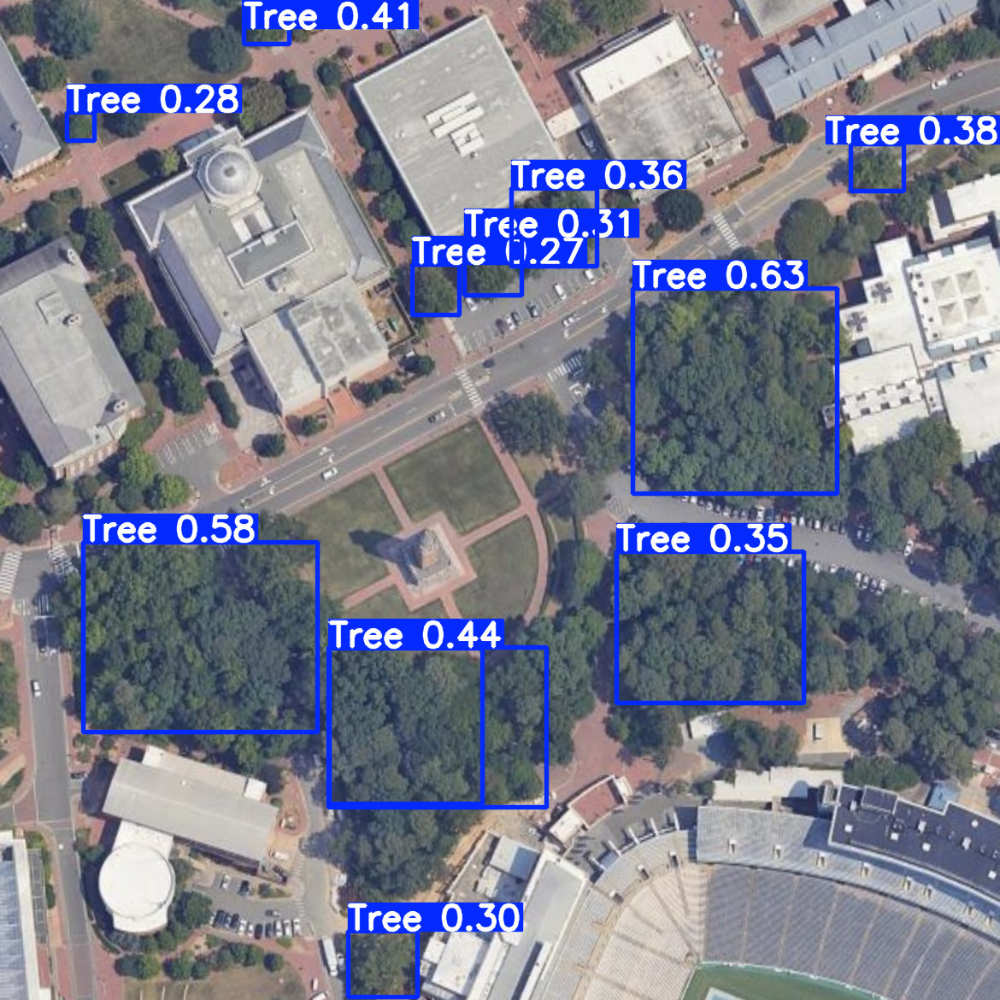

error: OpenCV(4.10.0) /io/opencv/modules/imgcodecs/src/loadsave.cpp:708: error: (-2:Unspecified error) could not find a writer for the specified extension in function 'imwrite_'


In [ ]:

# Load a model
model = YOLO("/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/nn08/weights/best.pt")  # pretrained YOLO11n model

# Run batched inference on a list of images
results = model(["/content/drive/MyDrive/565Project/uncsatelliteimages/belltower.PNG",
                 "/content/drive/MyDrive/565Project/uncsatelliteimages/haneshall.PNG",
                 "/content/drive/MyDrive/565Project/uncsatelliteimages/oldwell.PNG"])  # return a list of Results objects

# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save("/content/drive/MyDrive/565Project/uncsatelliteimages/predictions")  # save to disk


0: 416x416 12 Trees, 7.5ms
1: 416x416 18 Trees, 7.5ms
2: 416x416 35 Trees, 7.5ms
Speed: 1.7ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


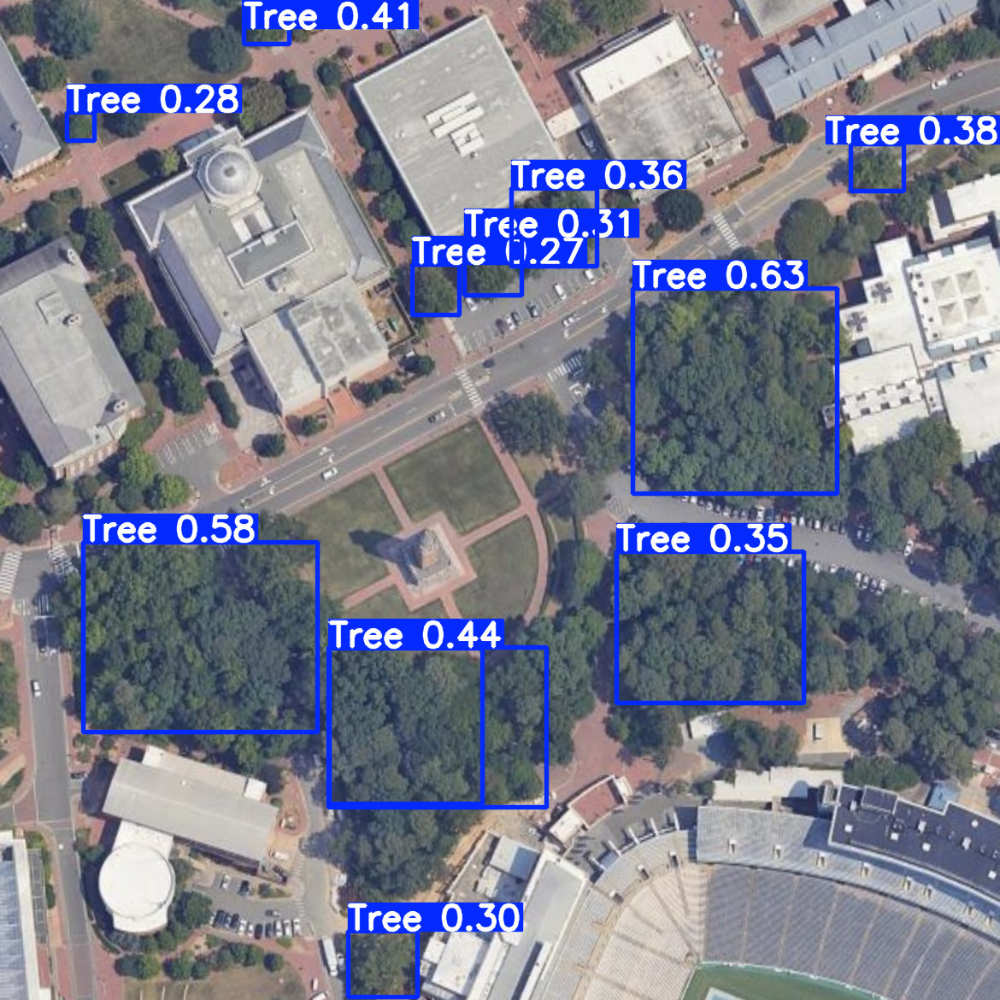

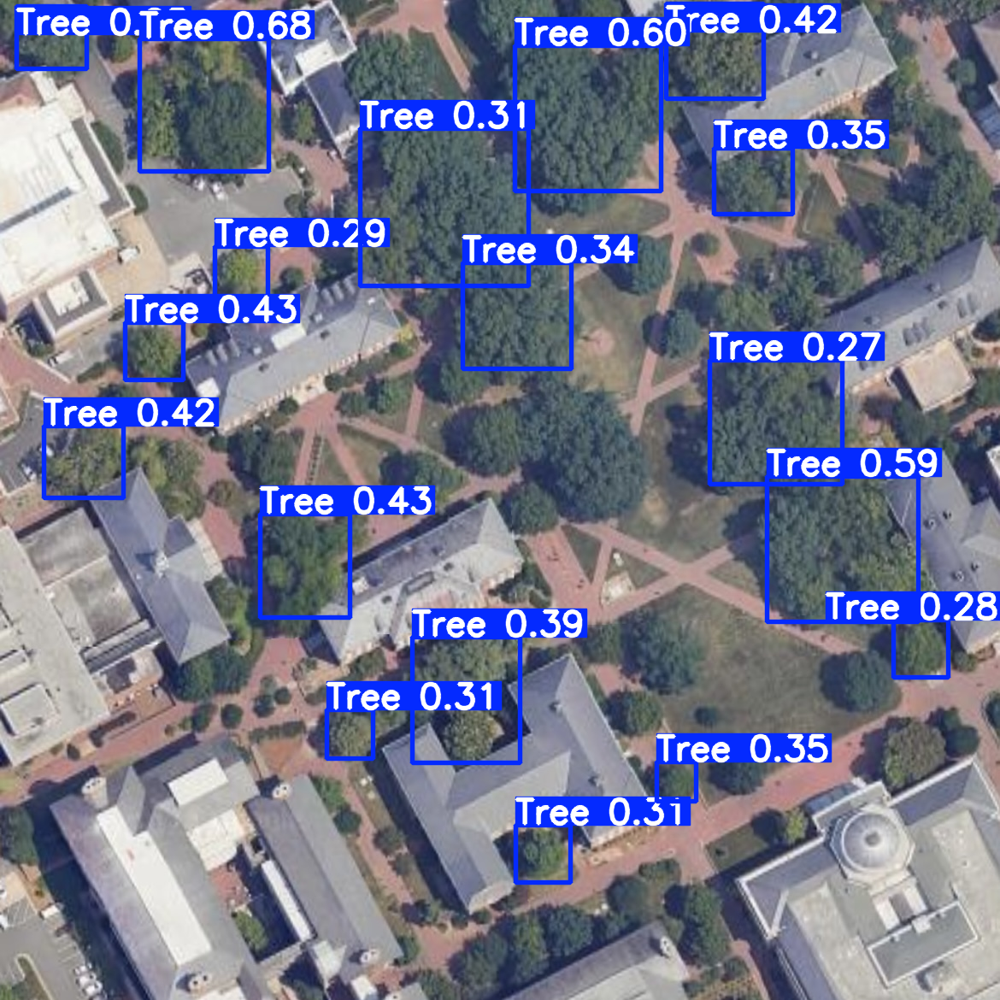

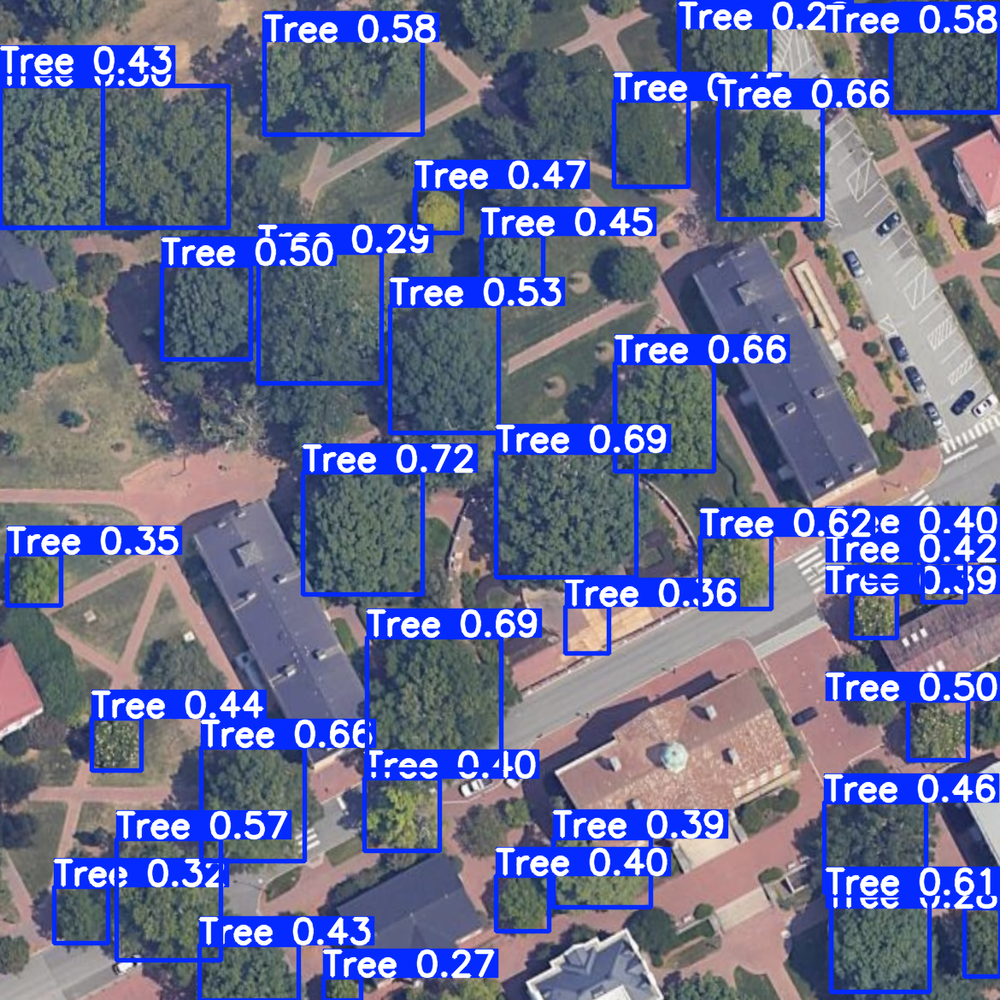

In [ ]:
# Load a model
model = YOLO("/content/drive/MyDrive/565Project/YOLOv11_Training_Outputs/nn08/weights/best.pt")  # pretrained YOLO11n model

# Run batched inference on a list of images
results = model(["/content/drive/MyDrive/565Project/uncsatelliteimages/belltower.PNG",
                 "/content/drive/MyDrive/565Project/uncsatelliteimages/haneshall.PNG",
                 "/content/drive/MyDrive/565Project/uncsatelliteimages/oldwell.PNG"])  # return a list of Results objects

# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
# Process results list
for i, result in enumerate(results):
    result.show()  # Display to screen
    # Save with unique filenames and proper extensions
    result.save(f"/content/drive/MyDrive/565Project/uncsatelliteimages/predictions_{i}.png")
